In [ ]:
!pip install matplotlib timm

# MiDaS dependencies

In [ ]:
# Download MiDaS dataset
midas = torch.hub.load('intel-isl/MiDaS', 'MiDaS_small')
midas.to('cuda') # or cpu
midas.eval()

# Download transforms pipeline
transform = torch.hub.load('intel-isl/MiDaS', 'transforms')
transform = transform.small_transform

In [29]:
!pip install cmapy

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for cmapy: filename=cmapy-0.6.6-py3-none-any.whl size=3967 sha256=91d948b278d438c8659cb82768313696297f30fcaa277269fc797f20acd629a2
  Stored in directory: c:\users\lizen\appdata\local\pip\cache\wheels\66\e0\cb\a8b547bb68d04027189f271e8f10738c81e8729674eb626c49
Successfully built cmapy


In [43]:
def apply_custom_colormap(image_gray, cmap=plt.get_cmap('viridis')):

    assert image_gray.dtype == np.uint8, 'must be np.uint8 image'
    if image_gray.ndim == 3: image_gray = image_gray.squeeze(-1)

    # Initialize the matplotlib color map
    sm = plt.cm.ScalarMappable(cmap=cmap)

    # Obtain linear color range
    color_range = sm.to_rgba(np.linspace(0, 1, 256))[:,0:3]    # color range RGBA => RGB
    color_range = (color_range*255.0).astype(np.uint8)         # [0,1] => [0,255]
    color_range = np.squeeze(np.dstack([color_range[:,2], color_range[:,1], color_range[:,0]]), 0)  # RGB => BGR

    # Apply colormap for each channel individually
    channels = [cv2.LUT(image_gray, color_range[:,i]) for i in range(3)]
    return np.dstack(channels)


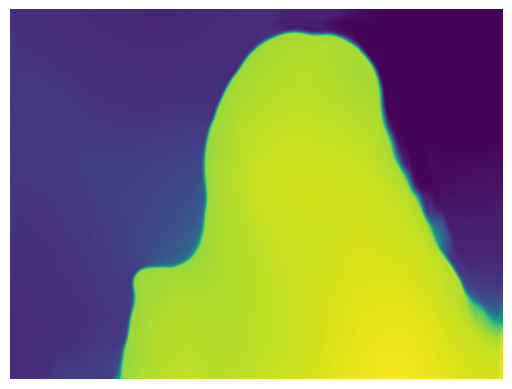

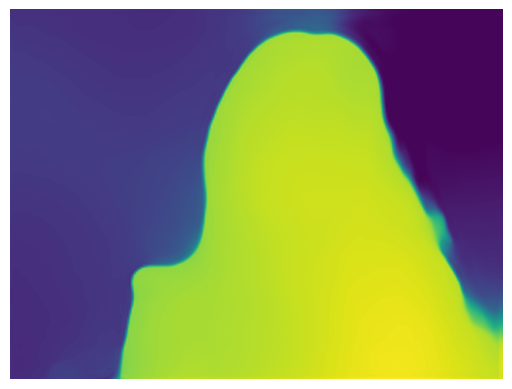

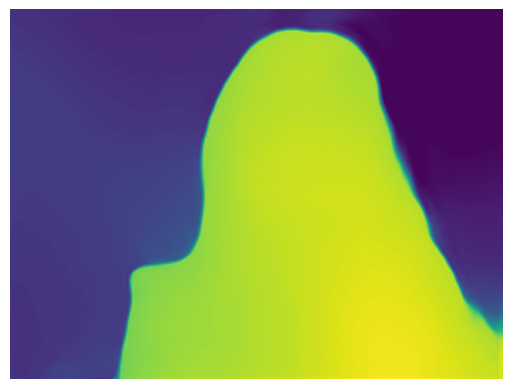

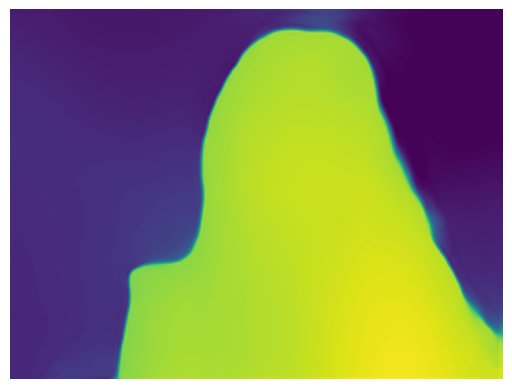

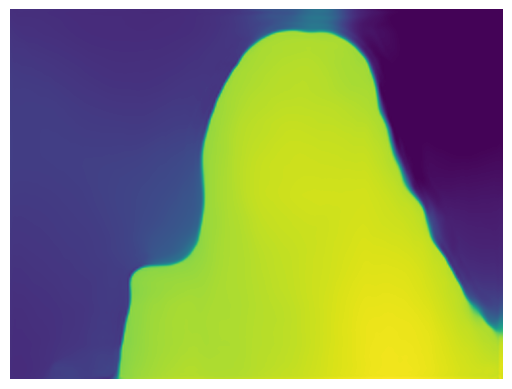

...

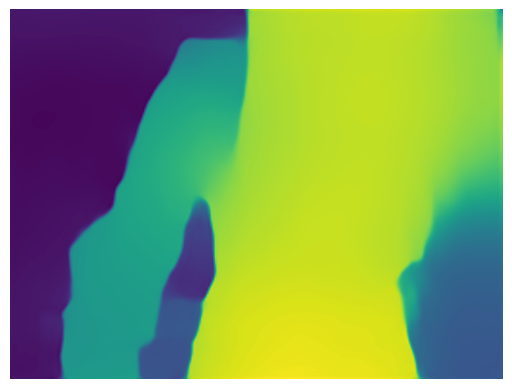

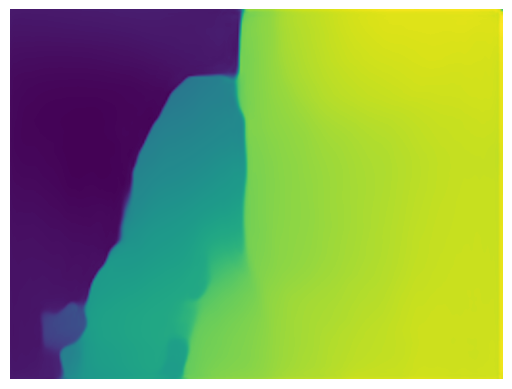

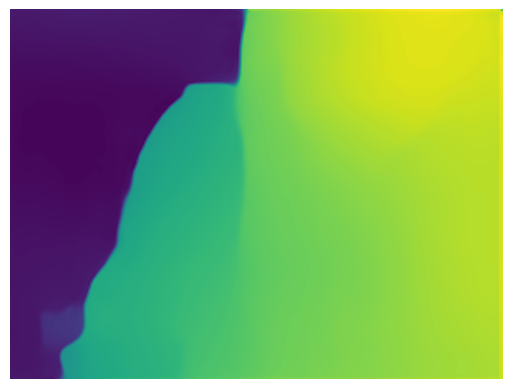

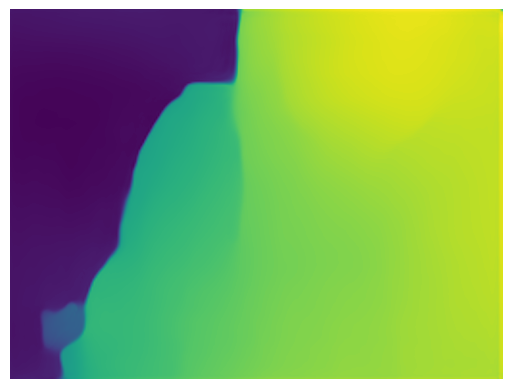

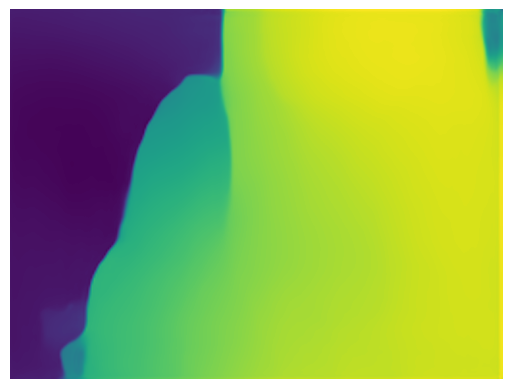

In [85]:
import numpy as np 
import cmapy

# Hook into opencv
cap = cv2.VideoCapture(0)
folder = "img3"

i = 0

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('output.mp4', fourcc, 20.0, (640, 480)) 

while cap.isOpened():
    ret, frame = cap.read()

    # Transform input for midas
    img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    imgbatch = transform(img).to('cuda') # or cpu

    # Make depth predictions
    with torch.no_grad():
        prediction = midas(imgbatch)
        prediction = torch.nn.functional.interpolate(
            prediction.unsqueeze(1),
            size = img.shape[:2],
            mode='bicubic',
            align_corners=False
        ).squeeze()

        output = prediction.cpu().numpy()

        #print(output)
  
    
    
    result = output.astype(np.uint8)
    #result = cv2.cvtColor(output, cv2.COLOR_RGB2BGR)
    #result = result.astype(np.uint8)
    result = apply_custom_colormap(result) #cv2.applyColorMap(result, cmapy.cmap('viridis'))
    plt.axis('off')
    plt.imshow(output)
    plt.savefig(folder + "/file%02d.png" % i, bbox_inches='tight',transparent=True, pad_inches=0)
    i+=1
    out.write(result) 
    cv2.imshow('CV2Frame', result) #frame
    plt.pause(0.00001)

    if cv2.waitKey(10) & 0xFF == ord('q'):
        cap.release()
        out.release() 
        cv2.destroyAllWindows

plt.show()





In [61]:
def save():
    os.system("ffmpeg -r 1 -i file%02d.png -vcodec mpeg4 -y movie.mp4")

save()

In [82]:
%pip install natsort

from natsort import natsorted
natsorted(os.listdir(image_folder))

Note: you may need to restart the kernel to use updated packages.


['.ipynb_checkpoints',
 'file00.png',
 'file01.png',
 'file02.png',
 'file03.png',
 'file04.png',
 'file05.png',
 'file06.png',
 'file07.png',
 'file08.png',
 'file09.png',
 'file10.png',
 'file11.png',
 'file12.png',
 'file13.png',
 'file14.png',
 'file15.png',
 'file16.png',
 'file17.png',
 'file18.png',
 'file19.png',
 'file20.png',
 'file21.png',
 'file22.png',
 'file23.png',
 'file24.png',
 'file25.png',
 'file26.png',
 'file27.png',
 'file28.png',
 'file29.png',
 'file30.png',
 'file31.png',
 'file32.png',
 'file33.png',
 'file34.png',
 'file35.png',
 'file36.png',
 'file37.png',
 'file38.png',
 'file39.png',
 'file40.png',
 'file41.png',
 'file42.png',
 'file43.png',
 'file44.png',
 'file45.png',
 'file46.png',
 'file47.png',
 'file48.png',
 'file49.png',
 'file50.png',
 'file51.png',
 'file52.png',
 'file53.png',
 'file54.png',
 'file55.png',
 'file56.png',
 'file57.png',
 'file58.png',
 'file59.png',
 'file60.png',
 'file61.png',
 'file62.png',
 'file63.png',
 'file64.png',
 '

In [87]:
import cv2
import os

image_folder = 'img3'
video_name = 'video5.mp4'

images = [img for img in natsorted(os.listdir(image_folder)) if img.endswith(".png")]
frame = cv2.imread(os.path.join(image_folder, images[0]))
height, width, layers = frame.shape

video = cv2.VideoWriter(video_name, 0, 16, (width,height)) # 8 = FPS

for image in images:
    video.write(cv2.imread(os.path.join(image_folder, image)))

cv2.destroyAllWindows()
video.release()

In [4]:
# Necessary Imports
import cv2
import torch
import matplotlib.pyplot as plt
from IPython.display import display, Image
import ipywidgets as widgets
import threading

In [13]:
# best so far

stopButton = widgets.ToggleButton(
    value=False,
    description='Stop',
    disabled=False,
    button_style='danger', # 'success', 'info', 'warning', 'danger' or ''
    tooltip='Description',
    icon='square' # (FontAwesome names without the `fa-` prefix)
)


cap = cv2.VideoCapture(0)
cap.set(3,640) # adjust width
cap.set(4,480) # adjust height

while True:
    success, img = cap.read()
    cv2.imshow("Webcam", img) # This will open an independent window
    if cv2.waitKey(1) & 0xFF==ord('q'): # quit when 'q' is pressed
        cap.release()
        break
        
cv2.destroyAllWindows() 
cv2.waitKey(1) 

-1

In [5]:
stopButton = widgets.ToggleButton(
    value=False,
    description='Stop',
    disabled=False,
    button_style='danger', # 'success', 'info', 'warning', 'danger' or ''
    tooltip='Description',
    icon='square' # (FontAwesome names without the `fa-` prefix)
)


# Display function
# ================
def view(button):
    cap = cv2.VideoCapture(0)
    display_handle=display(None, display_id=True)
    i = 0
    while True:
        _, frame = cap.read()
        frame = cv2.flip(frame, 1) # if your camera reverses your image
        _, frame = cv2.imencode('.jpeg', frame)
        display_handle.update(Image(data=frame.tobytes()))
        if stopButton.value==True:
            cap.release()
            display_handle.update(None)

            
# Run
# ================
display(stopButton)
thread = threading.Thread(target=view, args=(stopButton,))
thread.start()

ToggleButton(value=False, button_style='danger', description='Stop', icon='square', tooltip='Description')

None

Exception in thread Thread-6 (view):
Traceback (most recent call last):
  File "C:\Users\lizen\anaconda3\envs\cuda\Lib\threading.py", line 1038, in _bootstrap_inner
    self.run()
  File "C:\Users\lizen\anaconda3\envs\cuda\Lib\threading.py", line 975, in run
    self._target(*self._args, **self._kwargs)
  File "C:\Users\lizen\AppData\Local\Temp\ipykernel_4920\2989466907.py", line 20, in view
cv2.error: OpenCV(4.7.0) D:\a\opencv-python\opencv-python\opencv\modules\imgcodecs\src\loadsave.cpp:1109: error: (-215:Assertion failed) !image.empty() in function 'cv::imencode'



In [12]:
# https://stackoverflow.com/questions/27882255/is-it-possible-to-display-an-opencv-video-inside-the-ipython-jupyter-notebook 

import cv2
from IPython.display import display, Image

video = cv2.VideoCapture(0)
display_handle=display(None, display_id=True)
try:
    while True:
        _, frame = video.read()
        frame = cv2.flip(frame, 1) # if your camera reverses your image
        _, frame = cv2.imencode('.jpeg', frame)
        display_handle.update(Image(data=frame.tobytes()))
except KeyboardInterrupt:
    pass
finally:
    video.release()
    display_handle.update(None)

None